<a href="https://colab.research.google.com/github/gnouvj/NuimDetector/blob/main/Faster_R_CNN_Model_Train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setup and Initialization

In [ ]:
!wget https://d36yt3mvayqw5m.cloudfront.net/public/nuimages-v1.0/nuimages-v1.0-all-samples.tgz
!wget https://d36yt3mvayqw5m.cloudfront.net/public/nuimages-v1.0/nuimages-v1.0-all-metadata.tgz
!tar -xf nuimages-v1.0-all-samples.tgz
!tar -xf nuimages-v1.0-all-metadata.tgz

--2024-05-14 01:24:08--  https://d36yt3mvayqw5m.cloudfront.net/public/nuimages-v1.0/nuimages-v1.0-all-samples.tgz
Resolving d36yt3mvayqw5m.cloudfront.net (d36yt3mvayqw5m.cloudfront.net)... 108.158.4.226, 108.158.4.224, 108.158.4.74, ...
Connecting to d36yt3mvayqw5m.cloudfront.net (d36yt3mvayqw5m.cloudfront.net)|108.158.4.226|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16381401772 (15G) [application/x-tar]
Saving to: ‘nuimages-v1.0-all-samples.tgz’

nuimages-v1.0-all-s 100%[===================>]  15.26G   440MB/s    in 44s     

2024-05-14 01:24:53 (352 MB/s) - ‘nuimages-v1.0-all-samples.tgz’ saved [16381401772/16381401772]

--2024-05-14 01:24:53--  https://d36yt3mvayqw5m.cloudfront.net/public/nuimages-v1.0/nuimages-v1.0-all-metadata.tgz
Resolving d36yt3mvayqw5m.cloudfront.net (d36yt3mvayqw5m.cloudfront.net)... 108.158.4.60, 108.158.4.226, 108.158.4.74, ...
Connecting to d36yt3mvayqw5m.cloudfront.net (d36yt3mvayqw5m.cloudfront.net)|108.158.4.60|:443... conn

In [ ]:
!pip install nuscenes-devkit &> /dev/null

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-sr0jthbb
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-sr0jthbb
  Resolved https://github.com/facebookresearch/detectron2.git to commit 0ae803b1449cd2d3f8fa1b7c0f59356db10b3083
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 20.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 72.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 16.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp310-cp310-linux_x86_64.whl size=6147483 sha256=33cc13d7571cb375d993af46a4b6

In [ ]:
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow
import cv2
import os
import torch
import detectron2

In [ ]:
from nuimages import NuImages
from PIL import Image
nuim = NuImages(dataroot='/content', version='v1.0-train', verbose=True, lazy=True)
categories = nuim.category
file_categories = []
for i in range(len(categories)):
  file_categories.append(categories[i]['name'])
print(len(file_categories))
print(file_categories)

Loading nuImages tables for version v1.0-train...
Done loading in 0.001 seconds (lazy=True).
Loaded 25 category(s) in 0.000s,
25
['animal', 'flat.driveable_surface', 'human.pedestrian.adult', 'human.pedestrian.child', 'human.pedestrian.construction_worker', 'human.pedestrian.personal_mobility', 'human.pedestrian.police_officer', 'human.pedestrian.stroller', 'human.pedestrian.wheelchair', 'movable_object.barrier', 'movable_object.debris', 'movable_object.pushable_pullable', 'movable_object.trafficcone', 'static_object.bicycle_rack', 'vehicle.bicycle', 'vehicle.bus.bendy', 'vehicle.bus.rigid', 'vehicle.car', 'vehicle.construction', 'vehicle.ego', 'vehicle.emergency.ambulance', 'vehicle.emergency.police', 'vehicle.motorcycle', 'vehicle.trailer', 'vehicle.truck']


In [ ]:
def get_file_name(detailed_sample):
  filename3 = detailed_sample['filename']
  filename2 = filename3.replace('/',' ')
  filename1 = filename2.replace('.jpg','')
  filename = filename1.split()
  return filename[-1]

def create_files(nuim, file_categories):
  dataset = []
  RANGE = len(nuim.sample)
  for i in range(RANGE):
    file = {}
    sample = nuim.sample[i]
    detailed_sample = nuim.get('sample_data', sample['key_camera_token'])
    filepath = detailed_sample['filename']
    image = Image.open(f"/content/{filepath}")
    new_image = image.resize((1200,675))
    new_image.save(f"/content/{filepath}")
    file["file_name"] = detailed_sample['filename']
    file["image_id"] =  get_file_name(detailed_sample)
    file["height"] = int(detailed_sample['height'] * 0.75)
    file["width"] = int(detailed_sample['width'] * 0.75)

    objects = []
    object_tokens, surface_tokens = nuim.list_anns(sample['token'])
    for j in range(len(object_tokens)):
      ann = {}
      annotation = nuim.get('object_ann', object_tokens[j])
      box = annotation['bbox']
      reduced_annotation = [int(box[0] * 0.75), int(box[1] * 0.75), int(box[2] * 0.75), int(box[3] * 0.75)]
      ann["bbox"] = reduced_annotation
      ann["bbox_mode"] = BoxMode.XYXY_ABS
      id = nuim.get('category', annotation['category_token'])
      ann['category_id'] = file_categories.index(id['name'])

      objects.append(ann)

    file["annotations"] = objects
    dataset.append(file)
  return dataset

In [ ]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
from nuimages import NuImages
for i in ['train', 'val']:
  nuim = NuImages(dataroot='/content', version='v1.0-'+i, verbose=True, lazy=True)
  DatasetCatalog.register("v1.0_" + i, lambda: create_files(nuim, file_categories))
  MetadataCatalog.get("v1.0_"+i).set(thing_classes=file_categories)

v1_train = MetadataCatalog.get("v1.0_train")
v1_val = MetadataCatalog.get("v1.0_val")

Loading nuImages tables for version v1.0-train...
Done loading in 0.000 seconds (lazy=True).
Loading nuImages tables for version v1.0-val...
Done loading in 0.001 seconds (lazy=True).


In [ ]:
#epoch = max_iter * batch_size/n_samples = ~20 epochs
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("v1.0_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00001
cfg.SOLVER.MAX_ITER = 10500
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 25

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

Streaming output truncated to the last 5000 lines.

Printing surface annotations:
7a7bdc6f3a545ceb84fa360b9ed85222 flat.driveable_surface
cbf6e1fd20ae58a182a5bf87a2b0deb4 vehicle.ego
Printing object annotations:

Printing surface annotations:
29dbd6a083515841815520a4d78a7116 flat.driveable_surface
Printing object annotations:
107fc4db3d6348a0b7102b4a23f47ced vehicle.car ['vehicle.moving']
21a5613bccb048649d0d681ae8edd118 movable_object.barrier []
43389ae1ee214ccabef8ca63e50ecf90 human.pedestrian.construction_worker ['pedestrian.moving']
61ff60b58aba46a49421b0bad9570811 movable_object.barrier []
716fd3f6d51e43ffa0697ba5d1a8845f movable_object.trafficcone []
7702350b144e4578a689bb9972681fb4 movable_object.barrier []
836920de16214184ad28e030d3eafdd3 movable_object.barrier []
86c19b557ff44b9bbb021e570940b8ac movable_object.trafficcone []
8c3c50b38d9f4c0ba054cc02621f83c3 movable_object.trafficcone []
96df13e34e364e96a78b09f63d56c7a7 movable_object.barrier []
9b23ae7053d94333b8e99edafc4c8cb0

model_final_f6e8b1.pkl: 243MB [00:00, 264MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/14 01:47:14 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/14 01:47:21 d2.utils.events]:  eta: 0:20:42  iter: 19  total_loss: 4.482  loss_cls: 3.392  loss_box_reg: 0.8179  loss_rpn_cls: 0.1407  loss_rpn_loc: 0.1266    time: 0.1347  last_time: 0.1190  data_time: 0.0141  last_data_time: 0.0043   lr: 1.9981e-07  max_mem: 3216M
[05/14 01:47:26 d2.utils.events]:  eta: 0:20:30  iter: 39  total_loss: 4.442  loss_cls: 3.381  loss_box_reg: 0.845  loss_rpn_cls: 0.1106  loss_rpn_loc: 0.0839    time: 0.1291  last_time: 0.1035  data_time: 0.0049  last_data_time: 0.0043   lr: 3.9961e-07  max_mem: 3216M
[05/14 01:47:29 d2.utils.events]:  eta: 0:20:20  iter: 59  total_loss: 4.422  loss_cls: 3.376  loss_box_reg: 0.8289  loss_rpn_cls: 0.1181  loss_rpn_loc: 0.08411    time: 0.1235  last_time: 0.1173  data_time: 0.0046  last_data_time: 0.0046   lr: 5.9941e-07  max_mem: 3216M
[05/14 01:47:31 d2.utils.events]:  eta: 0:20:16  iter: 79  total_loss: 4.412  loss_cls: 3.376  loss_box_reg: 0.8406  loss_rpn_cls: 0.05322  loss_rpn_loc: 0.06425    time: 0.1215  last_tim

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [29]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.DATASETS.TEST = ("v1.0_val", )
predictor = DefaultPredictor(cfg)

[05/14 02:54:15 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [23]:
nuim = NuImages(dataroot='/content', version='v1.0-test', verbose=True, lazy=True)
sample = nuim.sample[2]
detailed_sample = nuim.get('sample_data', sample['key_camera_token'])

Loading nuImages tables for version v1.0-test...
Done loading in 0.000 seconds (lazy=True).
Loaded 9752 sample(s) in 0.012s,
Loaded 126276 sample_data(s) in 1.099s,


In [24]:
filepath = detailed_sample['filename']

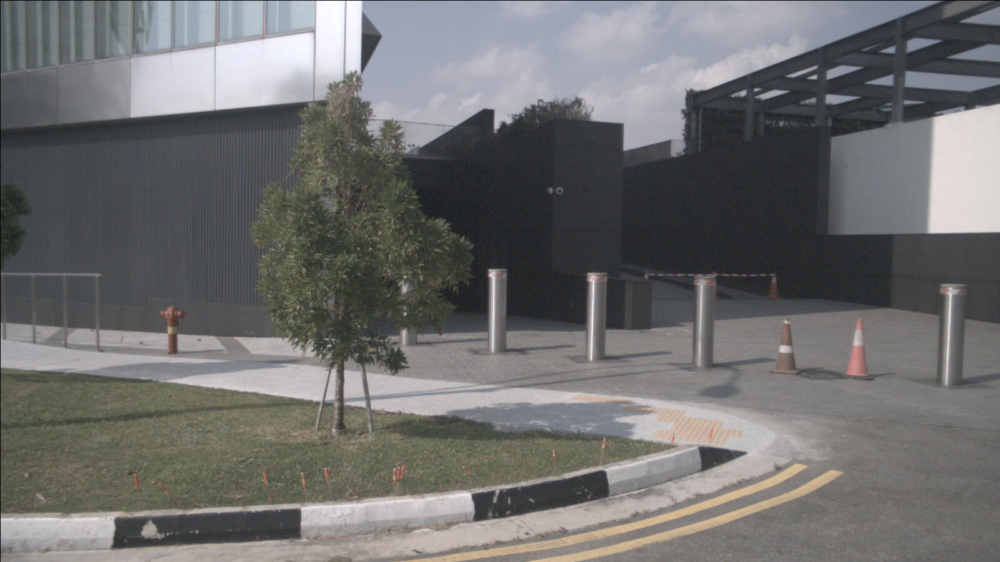

In [25]:
image = cv2.imread(f"./{filepath}")
cv2_imshow(image)

In [31]:
output = predictor(image)

In [27]:
print(output["instances"].pred_classes)
print(output["instances"].pred_boxes)

tensor([12, 12, 12, 12, 12, 12, 12, 12, 12, 12], device='cuda:0')
Boxes(tensor([[1346.4464,  506.7616, 1399.6626,  602.6331],
        [1231.3246,  505.7722, 1283.7313,  597.8212],
        [ 254.0627,  485.5236,  298.5108,  569.6399],
        [1226.7252,  439.3289, 1248.6860,  480.5710],
        [ 263.4149,  506.3268,  290.3756,  568.7570],
        [1357.1151,  509.1374, 1388.5070,  582.5975],
        [1241.7513,  511.1359, 1272.8568,  579.7399],
        [1490.1405,  451.0308, 1560.0682,  622.8871],
        [ 925.0612,  434.1620,  978.7025,  582.1342],
        [ 259.6246,  482.3640,  287.8358,  548.6865]], device='cuda:0'))


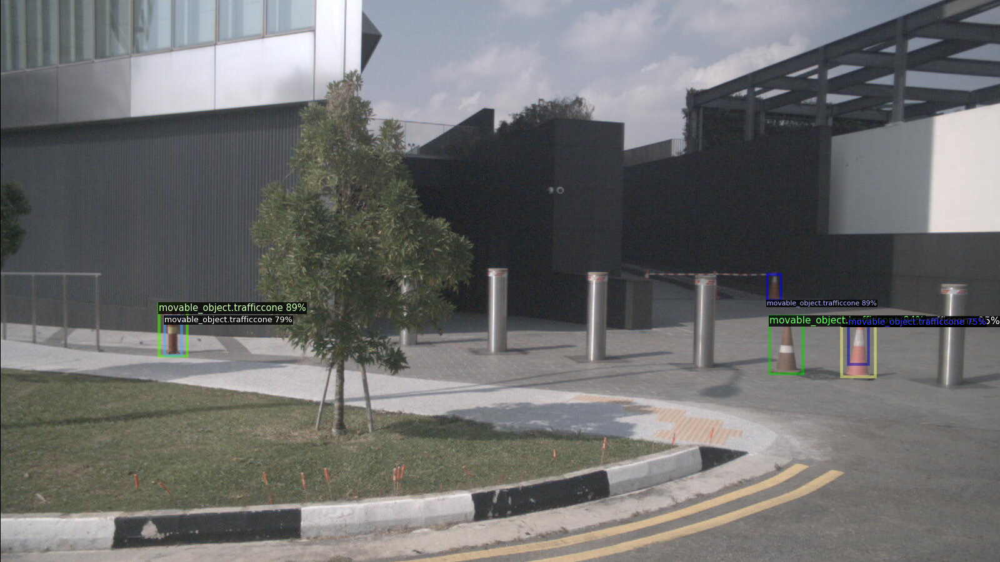

In [32]:
v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
out = v.draw_instance_predictions(output["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [22]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("v1.0_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "v1.0_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

Streaming output truncated to the last 5000 lines.
bdb99c604073403ba1924547b2585bce movable_object.trafficcone []
ca0bc98fdd544a5b9a5eee592238ffcf movable_object.barrier []
d263649803cf49a899f4e12cc73099e8 vehicle.car ['vehicle.moving']
f245b74109464c6b9d1f79e48fd30846 movable_object.barrier []
f3b8ba3f9fb14f06922901989afbee25 vehicle.bicycle ['cycle.with_rider']
f971bc8a39f04667a514b230cf004f32 movable_object.trafficcone []

Printing surface annotations:
5e7cc88249625a72a0c1e2e538254dad flat.driveable_surface
Printing object annotations:
055057673f9c4156978042002bb40e6e human.pedestrian.adult ['pedestrian.moving']
40515a64c19641a29cba472a01f67310 human.pedestrian.adult ['pedestrian.moving']
696fd492aca04319a16e9440f4a3453d vehicle.car ['vehicle.stopped']
a1dd5542b8ee414d8d0b219ee5d3719e human.pedestrian.adult ['pedestrian.moving']
a63fd97714d947e493235cf91138df4c vehicle.car ['vehicle.moving']
b6fda289c43f49ae8e2f49fccb8c586e human.pedestrian.adult ['pedestrian.moving']

Printing surf

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/14 02:32:02 d2.evaluation.evaluator]: Inference done 11/16445. Dataloading: 0.0017 s/iter. Inference: 0.0378 s/iter. Eval: 0.0004 s/iter. Total: 0.0399 s/iter. ETA=0:10:55
[05/14 02:32:07 d2.evaluation.evaluator]: Inference done 135/16445. Dataloading: 0.0018 s/iter. Inference: 0.0383 s/iter. Eval: 0.0004 s/iter. Total: 0.0406 s/iter. ETA=0:11:01
[05/14 02:32:12 d2.evaluation.evaluator]: Inference done 258/16445. Dataloading: 0.0019 s/iter. Inference: 0.0384 s/iter. Eval: 0.0004 s/iter. Total: 0.0408 s/iter. ETA=0:10:59
[05/14 02:32:17 d2.evaluation.evaluator]: Inference done 381/16445. Dataloading: 0.0019 s/iter. Inference: 0.0385 s/iter. Eval: 0.0004 s/iter. Total: 0.0408 s/iter. ETA=0:10:55
[05/14 02:32:22 d2.evaluation.evaluator]: Inference done 506/16445. Dataloading: 0.0018 s/iter. Inference: 0.0384 s/iter. Eval: 0.0004 s/iter. Total: 0.0407 s/iter. ETA=0:10:48
[05/14 02:32:27 d2.evaluation.evaluator]: Inference done 634/16445. Dataloading: 0.0018 s/iter. Inference: 0.0381 s/

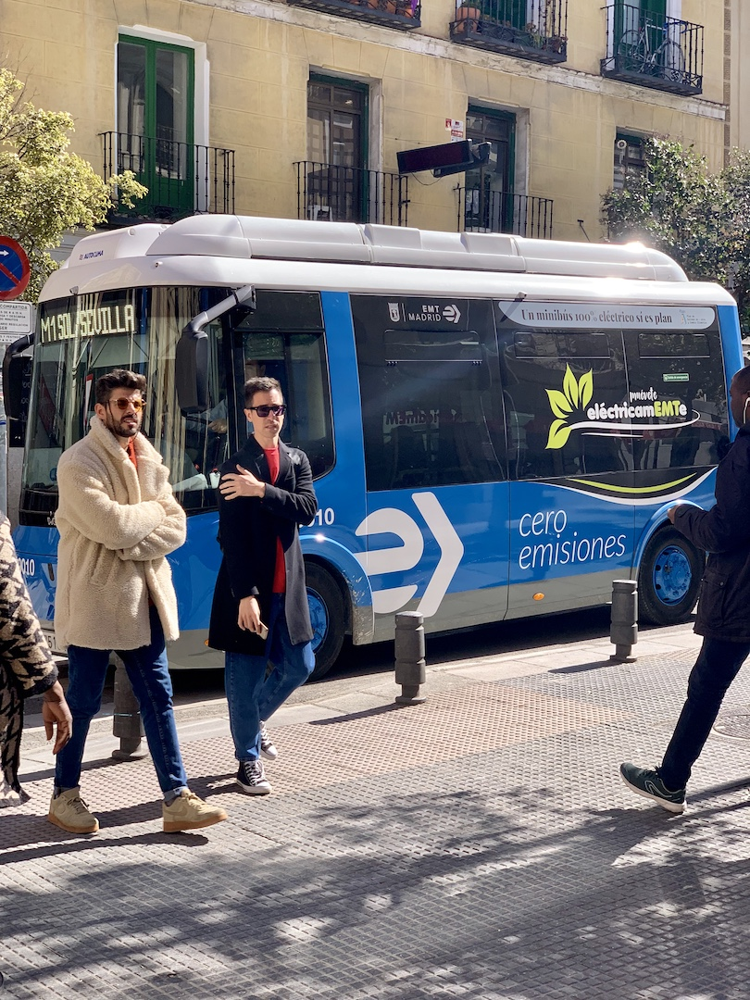

In [ ]:
image = cv2.imread("./bus.jpg")
cv2_imshow(image)

In [ ]:
output = predictor(image)

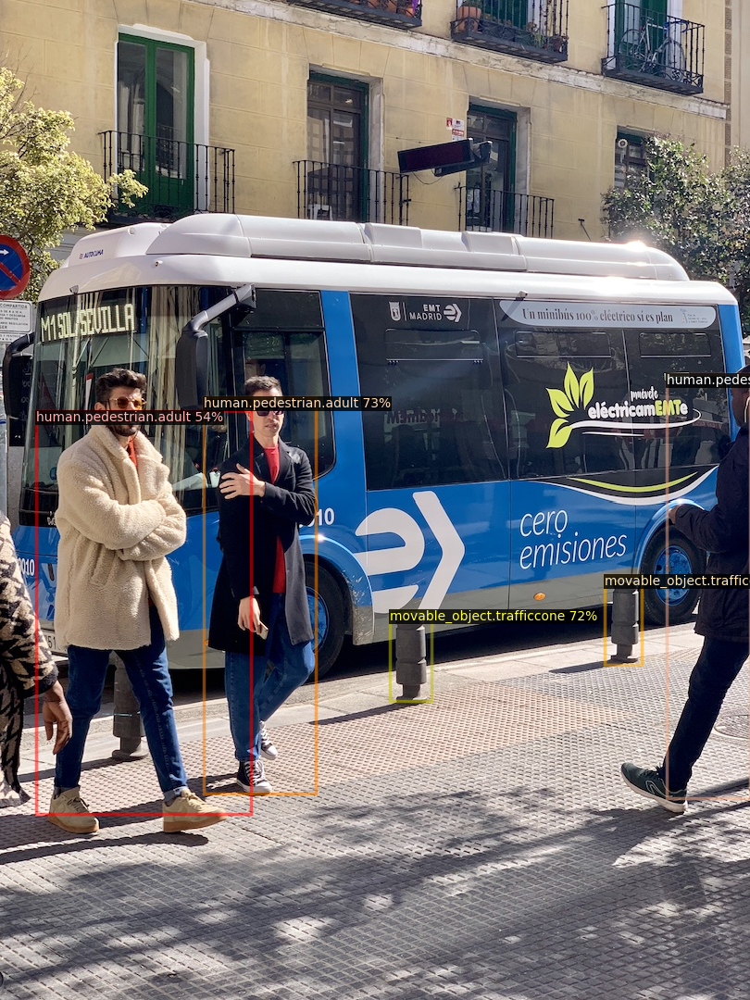

In [ ]:
v = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
out = v.draw_instance_predictions(output["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])